<a href="https://colab.research.google.com/github/prasadanvekar/elvtrdocs/blob/main/butterfly_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Image Classification Problem

#Step 1:

Download the Kaggle Butterfly Dataset - https://www.kaggle.com/datasets/gpiosenka/butterfly-images40-species

#Step 2:
 Install the required Libraries


In [2]:
pip install tensorflow numpy pandas matplotlib

#Step 3: Load and Preprocess the Data
We'll use TensorFlow's ImageDataGenerator to load and preprocess the images.

In [3]:
import zipfile
import os

# Specify the name of the .zip file
zip_file_name = 'sample.zip'  # Replace with your .zip file name

# Check if the file exists and delete it
if os.path.exists(zip_file_name):
    os.remove(zip_file_name)
    print(f"Deleted old file: {zip_file_name}")
else:
    print(f"No old file found: {zip_file_name}")



import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from google.colab import files
uploaded = files.upload()

print("Uploaded file size:", len(uploaded[list(uploaded.keys())[0]]))


# Unzip the dataset
zip_path = list(uploaded.keys())[0]  # Get the name of the uploaded file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('sample')


# Define paths
train_dir = '/content/sample/train'  # Replace with your dataset path
test_dir = '/content/sample/test'    # Replace with your dataset path

# List files in the train directory
print("Train directory contents:")
print(os.listdir(train_dir))

# List files in the test directory
print("Test directory contents:")
print(os.listdir(test_dir))


# Image preprocessing
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Load data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),  # Resize images to 150x150
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

No old file found: sample.zip


Saving sample.zip to sample.zip
Uploaded file size: 418471259
Train directory contents:
['RED CRACKER', 'QUESTION MARK', 'BIRD CHERRY ERMINE MOTH', 'CLEOPATRA', 'SOUTHERN DOGFACE', 'GLITTERING SAPPHIRE', 'LUNA MOTH', 'CLEARWING MOTH', 'VICEROY', 'POPINJAY', 'RED ADMIRAL', 'ELBOWED PIERROT', 'APPOLLO', 'BANDED ORANGE HELICONIAN', 'COMMON BANDED AWL', 'MONARCH', 'CHALK HILL BLUE', 'ULYSES', 'CHESTNUT', 'SCARCE SWALLOW', 'EASTERN DAPPLE WHITE', 'METALMARK', 'MILBERTS TORTOISESHELL', 'EASTERN PINE ELFIN', 'CHECQUERED SKIPPER', 'LARGE MARBLE', 'PINE WHITE', 'ATALA', 'GARDEN TIGER MOTH', 'GREAT EGGFLY', 'COMET MOTH', 'ORANGE OAKLEAF', 'BROWN ARGUS', 'ORCHARD SWALLOW', 'ZEBRA LONG WING', 'ORANGE TIP', 'DANAID EGGFLY', 'PURPLISH COPPER', 'BLUE MORPHO', 'STRAITED QUEEN', 'ARCIGERA FLOWER MOTH', 'PIPEVINE SWALLOW', 'GREEN HAIRSTREAK', 'HERCULES MOTH', 'MALACHITE', 'ADONIS', 'CRECENT', 'MOURNING CLOAK', 'ROSY MAPLE MOTH', 'BROOKES BIRDWING', 'GREAT JAY', 'HUMMING BIRD HAWK MOTH', 'WOOD SATYR', 'A

#Let's Display the Training and Test Data. Also analyze the class distribution

Train directory exists: True
Test directory exists: True
Dataset Summary:
                      Class  Train Images  Test Images
0               RED CRACKER           137            5
1             QUESTION MARK           110            5
2   BIRD CHERRY ERMINE MOTH           133            5
3                 CLEOPATRA           133            5
4          SOUTHERN DOGFACE           119            5
..                      ...           ...          ...
95      SIXSPOT BURNET MOTH           100            5
96             PAINTED LADY           111            5
97   MADAGASCAN SUNSET MOTH           123            5
98          CLOUDED SULPHUR           128            5
99                  IO MOTH           120            5

[100 rows x 3 columns]
Sample Images from Training Set:


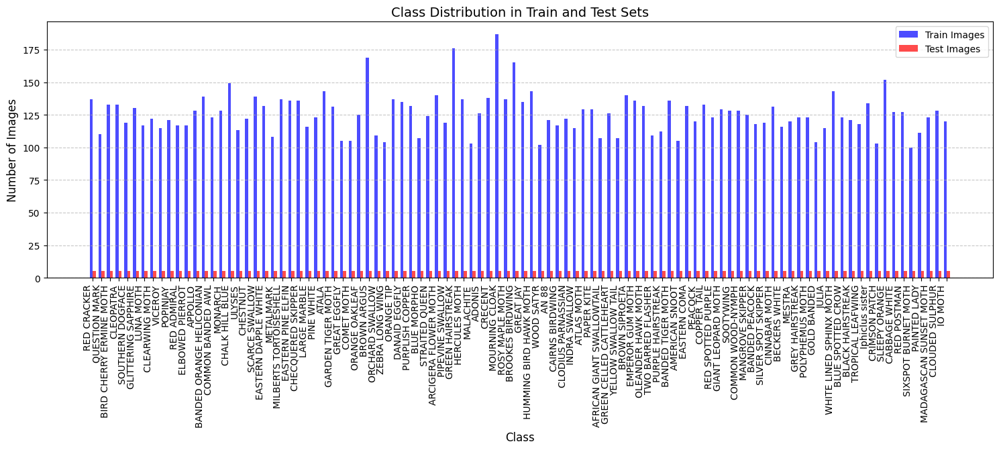

In [26]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path to the dataset
train_dir = '/content/sample/train'  # Replace with your train directory path
test_dir = '/content/sample/test'    # Replace with your test directory path

# Verify paths
print("Train directory exists:", os.path.exists(train_dir))
print("Test directory exists:", os.path.exists(test_dir))

# Function to count images in each class
def count_images(directory):
    class_counts = {}
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            class_counts[class_name] = len(os.listdir(class_dir))
    return class_counts

# Count images in train and test directories
train_counts = count_images(train_dir)
test_counts = count_images(test_dir)

# Create a pandas DataFrame to display the summary
summary = pd.DataFrame({
    'Class': list(train_counts.keys()),
    'Train Images': list(train_counts.values()),
    'Test Images': [test_counts.get(cls, 0) for cls in train_counts.keys()]
})

print("Dataset Summary:")
print(summary)

# Function to display sample images
def display_sample_images(directory, num_samples=3):
    num_classes = len(os.listdir(directory))
    plt.figure(figsize=(300, 200))  # Increased figure size
    for i, class_name in enumerate(os.listdir(directory)):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            # Get the first `num_samples` images from the class
            image_files = os.listdir(class_dir)[:num_samples]
            for j, image_file in enumerate(image_files):
                img_path = os.path.join(class_dir, image_file)
                try:
                    img = mpimg.imread(img_path)
                    plt.subplot(num_classes, num_samples, i * num_samples + j + 1)
                    plt.imshow(img)
                    plt.title(class_name)
                    plt.axis('off')
                except Exception as e:
                    print(f"Error loading image: {img_path}")
                    print(e)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.3)  # Adjusted spacing
    plt.show()

# Display sample images from the training set
print("Sample Images from Training Set:")
display_sample_images(train_dir, num_samples=3)

# Plot class distribution
# Plot class distribution as a bar graph
plt.figure(figsize=(15, 6))  # Set figure size

# Define the x-axis (classes) and y-axis (number of images)
classes = summary['Class']
train_images = summary['Train Images']
test_images = summary['Test Images']

# Plot the bars
bar_width = 0.35  # Width of each bar
index = range(len(classes))  # X-axis positions

plt.bar(index, train_images, bar_width, label='Train Images', color='b', alpha=0.7)
plt.bar([i + bar_width for i in index], test_images, bar_width, label='Test Images', color='r', alpha=0.7)

# Add labels, title, and legend
plt.xlabel('Class', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title('Class Distribution in Train and Test Sets', fontsize=14)
plt.xticks([i + bar_width / 2 for i in index], classes, rotation=90, ha='right', fontsize=10)  # Rotate x-axis labels for readability
plt.legend()

# Add grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.subplots_adjust(bottom=0.3)  # Add extra space at the bottom
plt.show()

#Step 4: Build the Model
We'll use a simple Convolutional Neural Network (CNN) for classification.

In [4]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Define the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(train_generator.num_classes, activation='softmax')  # Output layer
])

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 36992)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      18,940,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 100)                 │          51,300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,084,964 (72.80 MB)

 Trainable params: 19,084,964 (72.80 MB)

 Non-trainable params: 0 (0.00 B)

#Step 5: Train the Model
Train the model using the training data.

In [ ]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10,  # Adjust the number of epochs
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size
)

Epoch 1/10
158/393 ━━━━━━━━━━━━━━━━━━━━ 7:01 2s/step - accuracy: 0.5138 - loss: 1.8275

#Step 6: Evaluate the Model
Evaluate the model's performance on the test data.

In [ ]:
# Evaluate the model
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.2f}")

#Step 7: Save the Model
Save the trained model for future use.

In [ ]:
# Save the model
model.save('butterfly_classification_model.h5')

#Step 8: Make Predictions
You can use the trained model to make predictions on new images.

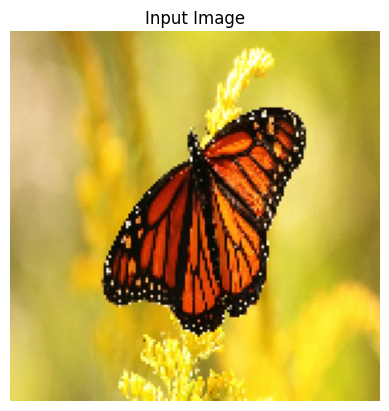

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
Predicted Class: MONARCH
Prediction Probabilities: [[2.3637506e-06 2.7796889e-03 5.8325983e-05 1.2884293e-02 1.7100700e-06
  2.1678536e-05 3.8102825e-04 6.7240057e-05 1.6889494e-02 2.6480036e-05
  6.7045307e-04 4.0419610e-07 2.2454942e-06 6.9210204e-05 1.2784421e-05
  6.9190505e-06 8.0111968e-06 2.6980310e-06 5.5787896e-05 5.5378269e-08
  1.5550712e-03 6.4747991e-07 5.2839174e-04 9.3064322e-05 6.2076381e-04
  3.3308996e-04 2.6920477e-06 2.3345984e-07 8.8616271e-06 1.4540277e-04
  1.7817356e-08 1.2666860e-07 4.5588022e-04 9.0558128e-04 2.1450794e-03
  5.7231910e-03 8.2375284e-04 1.0076293e-07 1.7568499e-06 4.0322817e-07
  6.8892004e-05 2.3195897e-03 1.7575749e-05 1.7124414e-06 1.7523813e-07
  3.3295579e-05 4.0488690e-04 3.7375346e-06 9.3328288e-07 8.7945100e-06
  7.8452777e-06 5.1259709e-04 2.8149181e-04 2.0212999e-02 5.1918400e-06
  8.4123650e-04 5.8650382e-09 2.3681605e-07 9.3467114e-03 6.1923394e-04
  8.4689248e-07 3.7307966e-06 1.6926539e-04 7.4

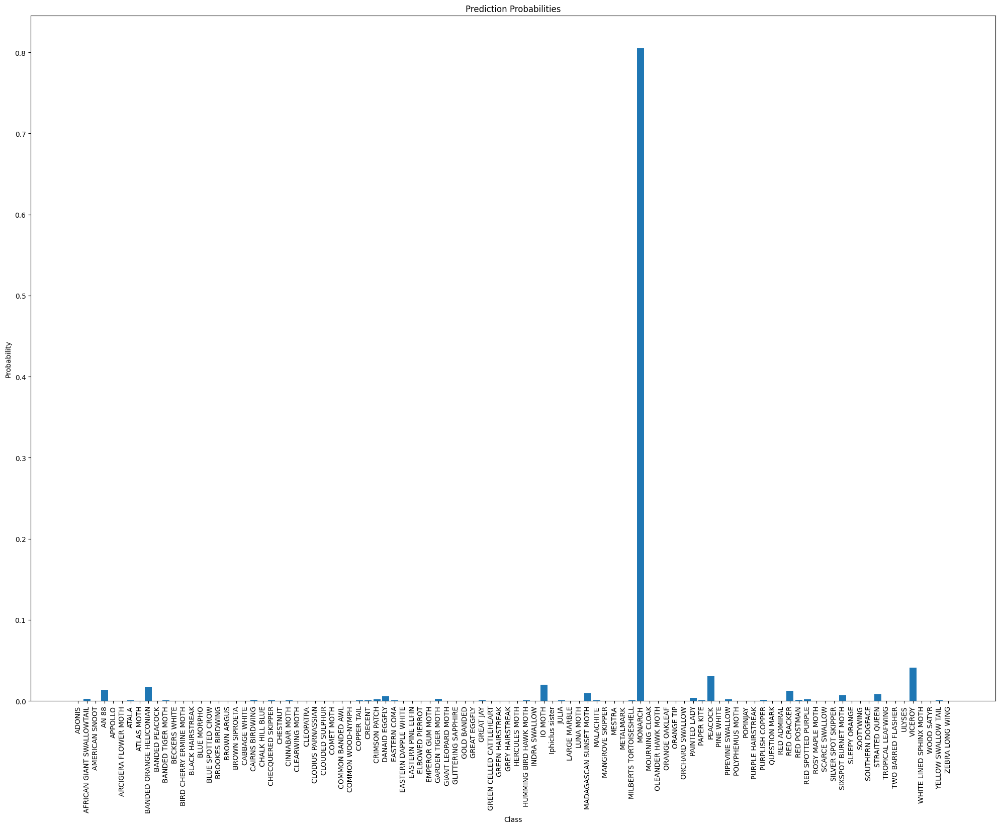

In [42]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Load a sample image
img_path = '/content/butterfly.jpg'  # Replace with your image path
img = image.load_img(img_path, target_size=(150, 150))  # Resize to match model input size

# Display the image
plt.imshow(img)
plt.axis('off')
plt.title('Input Image')
plt.show()

# Preprocess the image
img_array = image.img_to_array(img)  # Convert image to numpy array
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.0  # Normalize pixel values to [0, 1]

# Make prediction
predictions = model.predict(img_array)  # Get model predictions
predicted_class = np.argmax(predictions, axis=1)  # Get the class with the highest probability

# Map the predicted class index to the class name
class_names = list(train_generator.class_indices.keys())
predicted_class_name = class_names[predicted_class[0]]

# Display the prediction result
print(f"Predicted Class: {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Displat Top Predictions
top_n = 3
top_classes = np.argsort(predictions[0])[::-1][:top_n]
print("Top Predictions:")
for i, class_idx in enumerate(top_classes):
    print(f"{i + 1}. {class_names[class_idx]}: {predictions[0][class_idx]:.4f}")

#Visualize Prediction Probabilities
plt.figure(figsize=(20, 20))
plt.bar(range(len(class_names)), predictions[0])
plt.xticks(range(len(class_names)), class_names, rotation=90, fontsize=10)
plt.xlabel('Class')
plt.ylabel('Probability')
plt.title('Prediction Probabilities')
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.subplots_adjust(bottom=0.3)  # Add extra space at the bottom
plt.show()

#Donut Chart

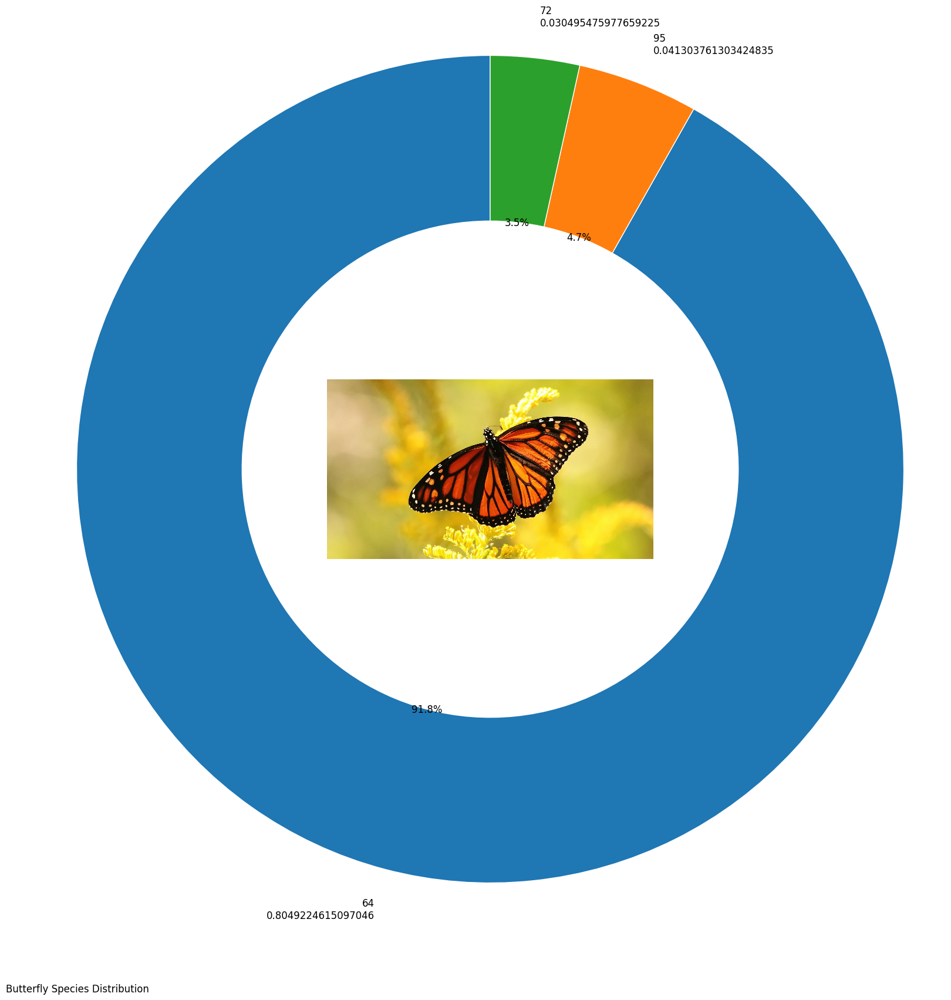

In [51]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import numpy as np

def draw_donut_chart(names, values, center_image_path, bottom_left_text):

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(20, 20))

    top_values = values
    # Create a donut chart
    wedges, texts, autotexts = ax.pie(
        top_values,
        labels=[f"{n}\n{v}" for n, v in zip(names, top_values)],  # Add value to labels
        autopct='%1.1f%%',
        startangle=90,
        wedgeprops=dict(width=0.4, edgecolor='w'),  # Create a donut shape
        textprops=dict(color="black", fontsize=12)
    )

    # Add a circle in the center to create the donut hole
    center_circle = plt.Circle((0, 0), 0.2, fc='white', edgecolor='white')
    ax.add_artist(center_circle)

    # Add an image to the center
    img = plt.imread(center_image_path)
    imagebox = OffsetImage(img, zoom=0.1)  # Adjust zoom to fit the image
    ab = AnnotationBbox(imagebox, (0, 0), frameon=False)
    ax.add_artist(ab)

    # Add a text line at the bottom left
    plt.figtext(0.1, 0.05, bottom_left_text, fontsize=12, color='black', ha='left')

    # Equal aspect ratio ensures the pie chart is circular
    ax.axis('equal')

    # Display the plot
    plt.show()

names = top_classes
values = predictions[0][top_classes]
center_image_path = '/content/butterfly.jpg'  # Replace with your image path
bottom_left_text = 'Butterfly Species Distribution'

draw_donut_chart(names, values, center_image_path, bottom_left_text)

Step 9: Let's display some of the key metrics using Matplotlib,numpy and sklearn
Confusion Matrix: To show the performance of the classification model.

Classification Report: To display precision, recall, F1-score, and support for each class.

ROC Curve: To visualize the trade-off between true positive rate (TPR) and false positive rate (FPR).

Precision-Recall Curve: To show the relationship between precision and recall.

In [27]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve
import numpy as np

# Assuming you have a trained model and test data
y_true = test_generator.classes  # True labels
y_pred = model.predict(test_generator)  # Predicted probabilities
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 467ms/step


#Confusion Matrix


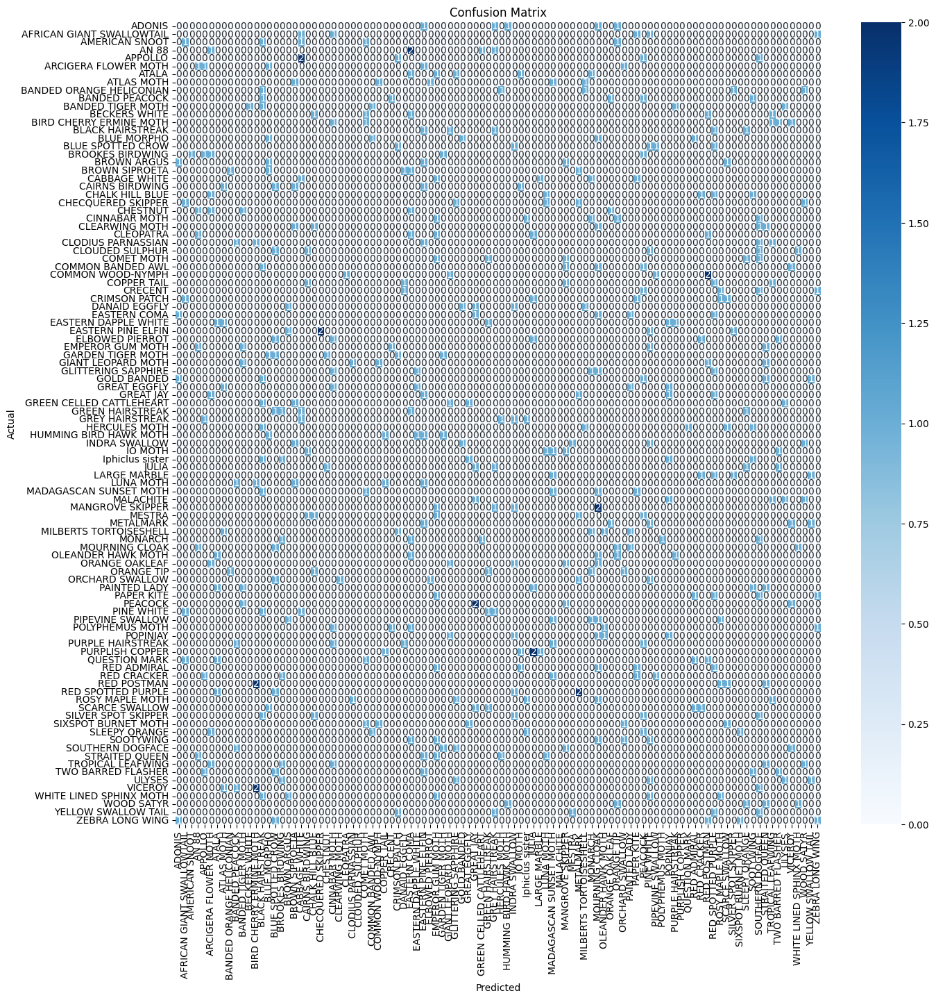

In [29]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#Classification Report

In [30]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys())
print("Classification Report:")
print(report)

Classification Report:
                           precision    recall  f1-score   support

                   ADONIS       0.00      0.00      0.00         5
AFRICAN GIANT SWALLOWTAIL       0.00      0.00      0.00         5
           AMERICAN SNOOT       0.00      0.00      0.00         5
                    AN 88       0.00      0.00      0.00         5
                  APPOLLO       0.00      0.00      0.00         5
     ARCIGERA FLOWER MOTH       0.00      0.00      0.00         5
                    ATALA       0.00      0.00      0.00         5
               ATLAS MOTH       0.00      0.00      0.00         5
 BANDED ORANGE HELICONIAN       0.00      0.00      0.00         5
           BANDED PEACOCK       0.00      0.00      0.00         5
        BANDED TIGER MOTH       0.00      0.00      0.00         5
            BECKERS WHITE       0.00      0.00      0.00         5
  BIRD CHERRY ERMINE MOTH       0.00      0.00      0.00         5
         BLACK HAIRSTREAK       0.00  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#ROC Curve

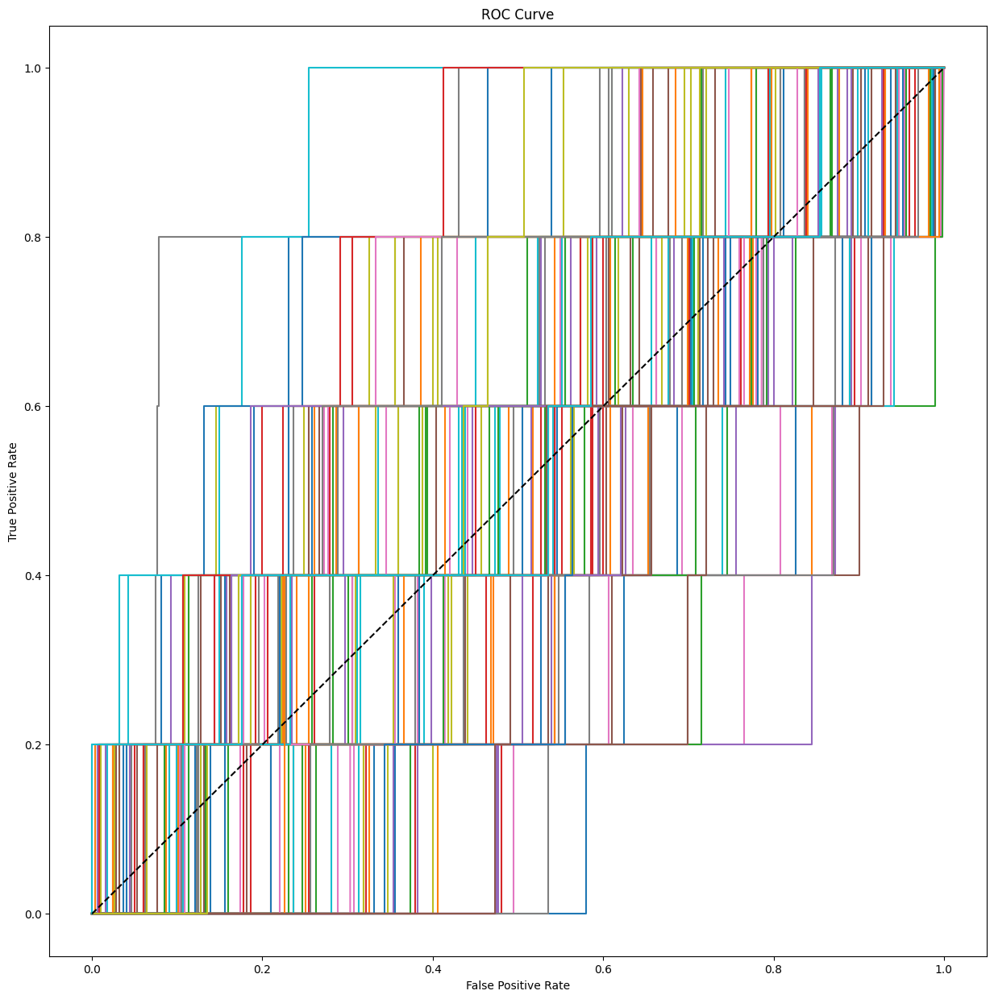

In [35]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the output for multi-class ROC
y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
n_classes = y_true_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(15, 15))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
#plt.legend(loc='best')
plt.show()

#Precision-Recall Curve

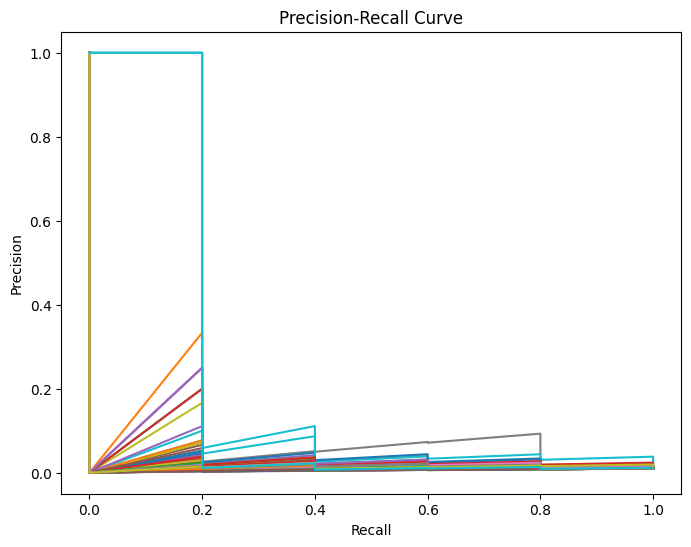

In [37]:
from sklearn.metrics import precision_recall_curve

# Compute precision-recall curve for each class
precision = dict()
recall = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_true_bin[:, i], y_pred[:, i])

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
#plt.legend(loc='lower left')
plt.show()

#Combine All Metrics in One Plot

<ipython-input-39-56dd2e067d7f>:37: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


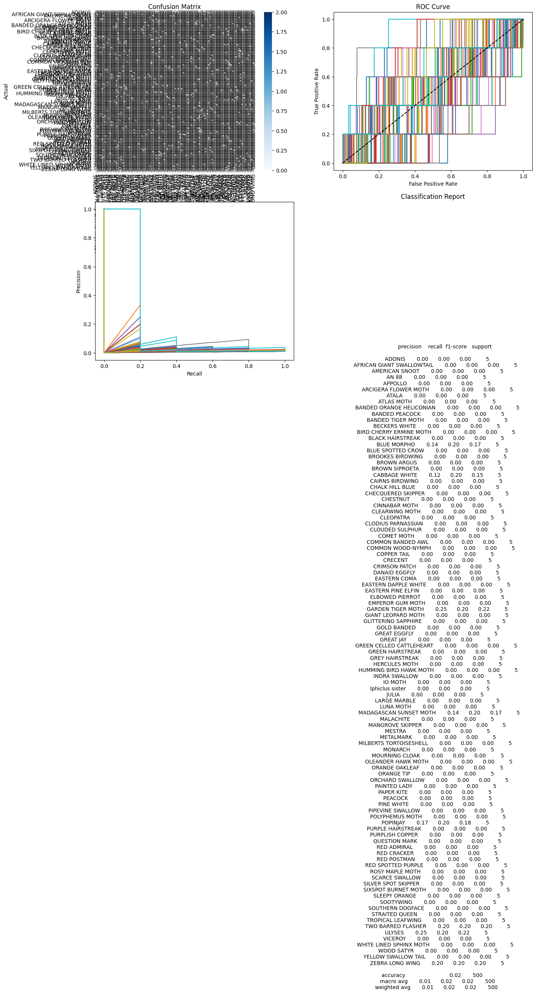

In [39]:
# Create a 2x2 grid for subplots
plt.figure(figsize=(15, 12))

# Confusion Matrix
plt.subplot(2, 2, 1)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# ROC Curve
plt.subplot(2, 2, 2)
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
#plt.legend(loc='lower right')

# Precision-Recall Curve
plt.subplot(2, 2, 3)
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
#plt.legend(loc='lower left')

# Classification Report (Text)
plt.subplot(2, 2, 4)
plt.text(0.1, 0.1, report, fontsize=10, va='top')
plt.axis('off')
plt.title('Classification Report')

# Adjust layout
plt.tight_layout()
plt.show()